## Notebook adapted from the original copy

Kudos to https://www.kaggle.com/code/tavuksuzdurum/resnet18 for the original notebook!

My modifications:

- Modified cross validation to use random patches instead of a single slice S_6. Included S_6 in training
- Added some plots to visualize the submission

In [1]:
import os
import time
import random
from pathlib import Path

import cv2
import h5py
import numpy as np
import pandas as pd
import torch
import torchvision
from torch.utils.data import DataLoader, Dataset
import torchvision.models as models
import torchvision.transforms as T
from sklearn.model_selection import train_test_split
from scipy.stats import spearmanr
from tqdm import tqdm
import torch.nn as nn
import torch.nn.functional as F
import imgaug
import wandb  
import warnings

import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")
# Original weights: https://github.com/ozanciga/self-supervised-histopathology/releases/tag/tenpercent

In [2]:
import os
def is_interactive():
   return os.environ.get('KAGGLE_KERNEL_RUN_TYPE','') == "Interactive"
print("is interactive session?", is_interactive())
num_epochs = 4 if is_interactive() else 16

time_limit = 60 if is_interactive() else 3600

is interactive session? False


In [3]:
CONFIG = {
    "seed": 42,
    "data_path": "/kaggle/input/el-hackathon-2025",
    "output_dir": "model_outputs",
    "batch_size": 32,
    "num_workers": 6,
    "learning_rate": 0.003,
    "weight_decay": 1e-2,
    "scheduler_step_size": 5,
    "scheduler_gamma": 0.1,
    "num_classes": 35,
    "image_size": (108, 108),
    "patch_size": 54,
    "max_epochs": num_epochs,
    "checkpoint_epochs": [3,4,5,7,9,11,13,15], # epoch 3 performed best
    "use_wandb": False,  # Set to False if you don't want to use wandb
    "model_type": "resnet18",  
    "mixed_precision": False,  # Use mixed precision training
}


In [4]:

# Utility functions
def set_seed(seed=42):
    """Set seeds for reproducibility"""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    imgaug.seed(seed)


def get_device():
    """Get the appropriate device"""
    if torch.cuda.is_available():
        return torch.device("cuda")
    elif torch.backends.mps.is_available():
        return torch.device("mps")  
    else:
        return torch.device("cpu")


def spearman_rank_correlation(x, y):
    """Calculate Spearman rank correlation"""
    # Handle edge cases
    if np.all(x == x[0]) or np.all(y == y[0]):
        return 0.0
    return spearmanr(x, y)[0]


def spearman_corr(preds, targets):
    """Calculate mean Spearman correlation across all samples"""
    correlations = []
    for i in range(len(preds)):
        corr = spearman_rank_correlation(preds[i], targets[i])
        # Only count valid correlations
        if not np.isnan(corr):
            correlations.append(corr)
    return np.mean(correlations)

In [5]:
import random

class HackhathonDataset(Dataset):
    """Dataset class for the hackathon competition"""

    def __init__(self, data_path, transform=None, mode="train"):
        self.data_path = data_path
        self.materials = []
        self.transform = transform

        # Define slides for train and validation sets
        train_slides = ["S_1", "S_2", "S_3", "S_4", "S_5", "S_6"]
        val_slides = ["S_1", "S_2", "S_3", "S_4", "S_5", "S_6"]  # Combine S1 to S6 for validation
        test_slide = ["S_7"]
        self.mode = mode

        if mode == "train":
            slide_list = train_slides
        elif mode == "val":
            slide_list = val_slides
        else:
            slide_list = test_slide

        with h5py.File(f"{self.data_path}/elucidata_ai_challenge_data.h5", "r") as h5file:
            images_group = "images/Train" if mode != "test" else "images/Test"
            spots_group = "spots/Train" if mode != "test" else "spots/Test"

            train_images = h5file[images_group]
            train_spots = h5file[spots_group]

            for slide_name in tqdm(slide_list, desc=f"Loading {mode} data"):
                if slide_name in train_images.keys():
                    image = np.array(train_images[slide_name])
                    spots = np.array(train_spots[slide_name])
                    df = pd.DataFrame(spots)
                    self._split_into_patches(image, df, CONFIG["patch_size"])

        print(f"{len(self.materials)} patches initialized for {mode} set")

    def __len__(self):
        return len(self.materials)

    def __getitem__(self, idx):
        image, stats = self.materials[idx]

        if self.transform:
            image = self.transform(image)

        # Use only gene expression values (excluding x, y coordinates)
        stats = torch.tensor(stats[2:], dtype=torch.float32)
        return image, stats

    def _split_into_patches(self, arr, df, patch_size):
        """Split the image into patches centered on spot coordinates"""
        h, w, c = arr.shape

        for idx in range(len(df)):
            row = df.iloc[idx]
            x, y = int(row["x"]), int(row["y"])

            half_size = patch_size // 2

            # Ensure patches don't go outside image boundaries
            y_min = max(y - half_size, 0)
            y_max = min(y + half_size, h)
            x_min = max(x - half_size, 0)
            x_max = min(x + half_size, w)

            patch = arr[y_min:y_max, x_min:x_max, :]

            # Only include complete patches
            if patch.shape[0] == patch_size and patch.shape[1] == patch_size:
                self.materials.append([patch, row])
            else:
                # Handle incomplete patches by padding
                padded_patch = np.zeros((patch_size, patch_size, c), dtype=patch.dtype)
                padded_patch[:patch.shape[0], :patch.shape[1], :] = patch
                self.materials.append([padded_patch, row])

    def _get_random_spots(self, slides):
        """Randomly sample spots from the first 6 slices"""
        random_spots = []
        for slide in slides:
            with h5py.File(f"{self.data_path}/elucidata_ai_challenge_data.h5", "r") as h5file:
                spots_group = f"spots/Train" if self.mode != "test" else "spots/Test"
                train_spots = h5file[spots_group]
                if slide in train_spots:
                    spots = np.array(train_spots[slide])
                    random_spots.extend(random.sample(list(spots), k=min(len(spots), 100)))  # Adjust 'k' for desired number of spots
        return random_spots


In [6]:
class DifferentiableSpearmanLoss(nn.Module):
    """Differentiable approximation of Spearman correlation loss"""

    def __init__(self, regularization_strength=1.0):
        super().__init__()
        self.regularization_strength = regularization_strength

    def forward(self, y_pred, y_true):
        y_pred = y_pred.float()
        y_true = y_true.float()

        # Calculate soft ranks
        pred_rank = self._soft_rank(y_pred)
        true_rank = self._soft_rank(y_true)

        # Normalize ranks
        pred_rank = F.normalize(pred_rank, dim=1)
        true_rank = F.normalize(true_rank, dim=1)

        # Calculate correlation
        spearman = torch.sum(pred_rank * true_rank, dim=1)
        return 1 - spearman.mean()

    def _soft_rank(self, x, regularization_strength=None):
        if regularization_strength is None:
            regularization_strength = self.regularization_strength

        x = x.unsqueeze(-1)  # [batch, n, 1]
        diff = x - x.transpose(-1, -2)  # [batch, n, n]
        P = torch.sigmoid(-regularization_strength * diff)  # pairwise comparisons
        ranks = P.sum(dim=-1)  # approximate ranks
        return ranks


class CombinedLoss(nn.Module):
    """Combined loss function using L1 and Spearman correlation"""

    def __init__(self, alpha=0.5, regularization_strength=1.0):
        super().__init__()
        self.l1 = nn.L1Loss()
        self.spearman = DifferentiableSpearmanLoss(regularization_strength)
        self.alpha = alpha

    def forward(self, y_pred, y_true):
        l1_loss = self.l1(y_pred, y_true)
        spearman_loss = self.spearman(y_pred, y_true)
        return l1_loss + self.alpha * spearman_loss


def create_model(model_type, num_classes):
    """Create and initialize the model"""
    if model_type == "resnet18":
        #model = models.wide_resnet101_2(weights=models.Wide_ResNet101_2_Weights.IMAGENET1K_V1)
        #model.fc = nn.Linear(model.fc.in_features, num_classes)
        MODEL_PATH = '/kaggle/input/ckpt-file/tenpercent_resnet18.ckpt'
        RETURN_PREACTIVATION = False  # return features from the model, if false return classification logits
        NUM_CLASSES = 35  # only used if RETURN_PREACTIVATION = False

        def load_model_weights(model, weights):

            model_dict = model.state_dict()
            weights = {k: v for k, v in weights.items() if k in model_dict}
            if weights == {}:
                print('No weight could be loaded..')
            model_dict.update(weights)
            model.load_state_dict(model_dict)

            return model

        model = models.resnet18(pretrained=False)

        state = torch.load(MODEL_PATH, map_location='cuda', weights_only=False)

        state_dict = state['state_dict']
        for key in list(state_dict.keys()):
            state_dict[key.replace('model.', '').replace('resnet.', '')] = state_dict.pop(key)

        model = load_model_weights(model, state_dict)

        if RETURN_PREACTIVATION:
            model.fc = torch.nn.Sequential()
        else:
            model.fc = torch.nn.Linear(model.fc.in_features, NUM_CLASSES)

    elif model_type == "resnet152":
        model = models.resnet152(weights=models.ResNet152_Weights.IMAGENET1K_V1)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_type == "efficientnet_b0":
        model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
        model.classifier = nn.Linear(model.classifier[1].in_features, num_classes)
    elif model_type == "efficientnet_b3":
        model = models.efficientnet_b7(weights=models.EfficientNet_B7_Weights.IMAGENET1K_V1)
        model.classifier = nn.Linear(model.classifier[1].in_features, num_classes)
    elif model_type == "convnext_large":
        model = models.convnext_large(weights=models.ConvNeXt_Large_Weights.IMAGENET1K_V1)
        in_features = model.classifier[2].in_features
        model.classifier[2] = nn.Linear(in_features, num_classes)
    else:
        raise ValueError(f"Unsupported model type: {model_type}")

    return model



def get_transforms():
    """Get data transformations for training and validation"""
    train_transform = T.Compose([
        T.ToTensor(),
        T.Resize(CONFIG["image_size"]),
        T.RandomApply([T.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1)], p=0.8),
        T.RandomHorizontalFlip(p=0.5),
        T.RandomVerticalFlip(p=0.5),
        T.RandomRotation(degrees=45),
        T.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    ])

    val_transform = T.Compose([
        T.ToTensor(),
        T.Resize(CONFIG["image_size"]),
    ])

    return train_transform, val_transform

In [7]:
def save_checkpoint(model, optimizer, scheduler, epoch, metrics, filename):
    """Save model checkpoint"""
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'metrics': metrics
    }
    torch.save(checkpoint, filename)


def train_one_epoch(model, dataloader, loss_fn, optimizer, device, scaler=None):
    """Train model for one epoch"""
    model.train()
    epoch_loss = 0
    all_preds, all_labels = [], []

    progress_bar = tqdm(dataloader, desc="Training")

    for images, labels in progress_bar:
        images = images.to(device)
        labels = labels.to(device)

        if scaler:  # Using mixed precision
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = loss_fn(outputs, labels)

            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            outputs = model(images)
            loss = loss_fn(outputs, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        epoch_loss += loss.item()

        # Store predictions and labels for metrics calculation
        all_preds.extend(outputs.detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())

        # Update progress bar
        progress_bar.set_postfix({"loss": f"{loss.item():.4f}"})

    # Calculate metrics
    avg_loss = epoch_loss / len(dataloader)
    spearman_score = spearman_corr(all_preds, all_labels)

    return avg_loss, spearman_score, all_preds, all_labels


def validate(model, dataloader, loss_fn, device):
    """Validate model on validation set"""
    model.eval()
    val_loss = 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Validation"):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = loss_fn(outputs, labels)

            val_loss += loss.item()

            # Store predictions and labels for metrics calculation
            all_preds.extend(outputs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate metrics
    avg_loss = val_loss / len(dataloader)
    spearman_score = spearman_corr(all_preds, all_labels)

    return avg_loss, spearman_score, all_preds, all_labels


def predict_test_set(model, data_path, device, transform):
    """Generate predictions for the test set"""
    with h5py.File(f"{data_path}/elucidata_ai_challenge_data.h5", "r") as f:
        test_spots = f["spots/Test"]
        test_images = f["images/Test"]
        sample = 'S_7'  # Test sample
        image = np.array(test_images[sample])
        spots = np.array(test_spots[sample])
        x, y = spots["x"], spots["y"]

        outputs = []
        model.eval()
        with torch.no_grad():
            patch_size = CONFIG["patch_size"]
            for x_, y_ in tqdm(zip(x, y), desc="Generating predictions", total=len(x)):
                half_size = patch_size // 2
                # Ensure indices are within bounds
                y_min = max(y_ - half_size, 0)
                y_max = min(y_ + half_size, image.shape[0])
                x_min = max(x_ - half_size, 0)
                x_max = min(x_ + half_size, image.shape[1])
                patch = image[y_min:y_max, x_min:x_max, :]

                # Handle incomplete patches
                if patch.shape[0] != patch_size or patch.shape[1] != patch_size:
                    padded_patch = np.zeros((patch_size, patch_size, 3), dtype=patch.dtype)
                    padded_patch[:patch.shape[0], :patch.shape[1], :] = patch
                    patch = padded_patch

                patch_tensor = transform(patch)
                patch_tensor = patch_tensor.to(device)
                output = model(patch_tensor.unsqueeze(0)).cpu().numpy()
                outputs.append(output[0])

    return np.array(outputs), x, y


def save_submission(predictions):
    """Save predictions to submission file"""
    example_df = pd.read_csv("/kaggle/input/sample-submission/submission (1).csv")
    ID = example_df["ID"]
    output_df = pd.DataFrame(predictions)
    submission_df = pd.concat([ID, output_df], axis=1)
    submission_df.columns = example_df.columns

    output_file = "submission.csv"
    submission_df.to_csv(output_file, index=False)
    print(f"Saved submission to {output_file}")

    return output_file


def plot_cell_abundance(predictions):
    # Get the list of cell types (columns)
    cell_types = predictions.columns

    # Set the number of rows and columns for the grid of subplots
    num_cell_types = len(cell_types)
    cols = 5  # You can adjust this depending on the number of cell types
    rows = (num_cell_types // cols) + (1 if num_cell_types % cols > 0 else 0)
    
    fig, axes = plt.subplots(rows, cols, figsize=(cols*5, rows*5))
    
    # Flatten axes array in case of multiple rows and columns
    axes = axes.flatten()

    # Plot abundance for each cell type
    for i, cell_type in enumerate(cell_types):
        axes[i].bar(np.arange(len(predictions)), predictions[cell_type], color='skyblue')
        axes[i].set_title(f'Abundance of {cell_type}')
        axes[i].set_xlabel('Sample Index')
        axes[i].set_ylabel('Abundance')
        
    # Remove extra subplots if necessary
    for i in range(num_cell_types, len(axes)):
        axes[i].axis('off')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

In [8]:
def main():
    """Main training function"""
    set_seed(CONFIG["seed"])
    device = get_device()
    print(f"Using device: {device}")

    # Create data transformations
    train_transform, val_transform = get_transforms()

    # Create datasets and dataloaders
    train_dataset = HackhathonDataset(
        CONFIG["data_path"],
        transform=train_transform,
        mode="train"
    )
    val_dataset = HackhathonDataset(
        CONFIG["data_path"],
        transform=val_transform,
        mode="val"
    )

    train_loader = DataLoader(
        train_dataset,
        batch_size=CONFIG["batch_size"],
        shuffle=True,
        num_workers=CONFIG["num_workers"],
        pin_memory=True
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=CONFIG["batch_size"],
        shuffle=False,
        num_workers=CONFIG["num_workers"],
        pin_memory=True
    )

    # Create model
    model = create_model(CONFIG["model_type"], CONFIG["num_classes"])
    model = model.to(device)

    # Create loss function, optimizer and scheduler
    loss_fn = CombinedLoss(alpha=0.7)
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=CONFIG["learning_rate"],
        weight_decay=CONFIG["weight_decay"]
    )

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=CONFIG["scheduler_gamma"],
        patience=3,

    )

    # Initialize mixed precision scaler if needed
    scaler = torch.cuda.amp.GradScaler() if CONFIG["mixed_precision"] and device.type == "cuda" else None

    # Initialize wandb if enabled
    if CONFIG["use_wandb"]:
        wandb.init(
            project="hackathon-gene-expression",
            config=CONFIG,
            name=f"{CONFIG['model_type']}_run"
        )

        # Log model architecture
        wandb.watch(model)

    # Training loop
    best_val_spearman = -1
    for epoch in range(CONFIG["max_epochs"]):
        print(f"\nEpoch {epoch + 1}/{CONFIG['max_epochs']}")

        # Train one epoch
        train_loss, train_spearman, _, _ = train_one_epoch(
            model, train_loader, loss_fn, optimizer, device, scaler
        )

        # Validate
        val_loss, val_spearman, _, _ = validate(
            model, val_loader, loss_fn, device
        )

        # Update scheduler
        scheduler.step(val_loss)

        # Log metrics
        metrics = {
            "train_loss": train_loss,
            "train_spearman": train_spearman,
            "val_loss": val_loss,
            "val_spearman": val_spearman,
            "learning_rate": optimizer.param_groups[0]['lr']
        }
        for param_group in optimizer.param_groups:
            print(f"current learning rate: {param_group['lr']}")

        print(f"Train Loss: {train_loss:.4f}, Train Spearman: {train_spearman:.4f}")
        print(f"Val Loss: {val_loss:.4f}, Val Spearman: {val_spearman:.4f}")

        if CONFIG["use_wandb"]:
            wandb.log(metrics)

        # Save best model
        #if val_spearman > best_val_spearman:
        #    best_val_spearman = val_spearman
        #    save_checkpoint(
        #        model, optimizer, scheduler, epoch, metrics,
        #        f"{CONFIG['output_dir']}/{CONFIG['model_type']}_best.pth"
        #    )
        #    print(f"Saved best model with validation Spearman: {val_spearman:.4f}")

        # Generate and save predictions at checkpoint epochs
        if epoch in CONFIG["checkpoint_epochs"]:
            # Save regular checkpoint
            #save_checkpoint(
            #    model, optimizer, scheduler, epoch, metrics,
            #    f"{CONFIG['output_dir']}/{CONFIG['model_type']}_epoch_{epoch}.pth"
            #)

            # Generate test predictions
            test_preds, _, _ = predict_test_set(model, CONFIG["data_path"], device, val_transform)

            # Save submission file
            submission_file = save_submission(test_preds)
            #plot_cell_abundance(test_preds)

            if CONFIG["use_wandb"]:
                wandb.save(submission_file)

    # Clean up
    if CONFIG["use_wandb"]:
        wandb.finish()

    print("Training completed!")
    return test_preds


test_preds = main()

Using device: cuda


Loading train data: 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]


8349 patches initialized for train set


Loading val data: 100%|██████████| 6/6 [00:01<00:00,  3.22it/s]


8349 patches initialized for val set

Epoch 1/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 88.83it/s]


current learning rate: 0.003
Train Loss: 0.2497, Train Spearman: 0.5075
Val Loss: 0.2265, Val Spearman: 0.6100

Epoch 2/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 89.54it/s]


current learning rate: 0.003
Train Loss: 0.2342, Train Spearman: 0.5838
Val Loss: 0.2365, Val Spearman: 0.6200

Epoch 3/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 89.76it/s]


current learning rate: 0.003
Train Loss: 0.2297, Train Spearman: 0.6115
Val Loss: 0.2190, Val Spearman: 0.6213

Epoch 4/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 88.98it/s] 


current learning rate: 0.003
Train Loss: 0.2280, Train Spearman: 0.6273
Val Loss: 0.2252, Val Spearman: 0.5609


Generating predictions: 100%|██████████| 2088/2088 [00:06<00:00, 319.97it/s]


Saved submission to submission.csv

Epoch 5/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 88.98it/s] 


current learning rate: 0.003
Train Loss: 0.2258, Train Spearman: 0.6296
Val Loss: 0.2164, Val Spearman: 0.6509


Generating predictions: 100%|██████████| 2088/2088 [00:06<00:00, 322.58it/s]


Saved submission to submission.csv

Epoch 6/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 91.62it/s] 


current learning rate: 0.003
Train Loss: 0.2250, Train Spearman: 0.6433
Val Loss: 0.2190, Val Spearman: 0.6717


Generating predictions: 100%|██████████| 2088/2088 [00:06<00:00, 316.07it/s]


Saved submission to submission.csv

Epoch 7/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 91.72it/s] 


current learning rate: 0.003
Train Loss: 0.2237, Train Spearman: 0.6455
Val Loss: 0.2344, Val Spearman: 0.6115

Epoch 8/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 89.90it/s] 


current learning rate: 0.003
Train Loss: 0.2222, Train Spearman: 0.6497
Val Loss: 0.2182, Val Spearman: 0.6561


Generating predictions: 100%|██████████| 2088/2088 [00:06<00:00, 320.54it/s]


Saved submission to submission.csv

Epoch 9/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 91.11it/s] 


current learning rate: 0.003
Train Loss: 0.2215, Train Spearman: 0.6535
Val Loss: 0.2145, Val Spearman: 0.6465

Epoch 10/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 87.89it/s]


current learning rate: 0.003
Train Loss: 0.2214, Train Spearman: 0.6540
Val Loss: 0.2198, Val Spearman: 0.6653


Generating predictions: 100%|██████████| 2088/2088 [00:06<00:00, 321.91it/s]


Saved submission to submission.csv

Epoch 11/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 90.05it/s] 


current learning rate: 0.003
Train Loss: 0.2209, Train Spearman: 0.6574
Val Loss: 0.2144, Val Spearman: 0.6477

Epoch 12/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 90.22it/s] 


current learning rate: 0.003
Train Loss: 0.2197, Train Spearman: 0.6567
Val Loss: 0.2229, Val Spearman: 0.6528


Generating predictions: 100%|██████████| 2088/2088 [00:06<00:00, 321.65it/s]


Saved submission to submission.csv

Epoch 13/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 90.79it/s] 


current learning rate: 0.003
Train Loss: 0.2195, Train Spearman: 0.6600
Val Loss: 0.2351, Val Spearman: 0.6591

Epoch 14/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 90.54it/s] 


current learning rate: 0.003
Train Loss: 0.2189, Train Spearman: 0.6622
Val Loss: 0.2140, Val Spearman: 0.6593


Generating predictions: 100%|██████████| 2088/2088 [00:06<00:00, 323.44it/s]


Saved submission to submission.csv

Epoch 15/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 89.64it/s] 


current learning rate: 0.003
Train Loss: 0.2191, Train Spearman: 0.6601
Val Loss: 0.2075, Val Spearman: 0.6861

Epoch 16/16


Validation: 100%|██████████| 261/261 [00:02<00:00, 88.61it/s]


current learning rate: 0.003
Train Loss: 0.2176, Train Spearman: 0.6613
Val Loss: 0.2075, Val Spearman: 0.6800


Generating predictions: 100%|██████████| 2088/2088 [00:06<00:00, 320.17it/s]


Saved submission to submission.csv
Training completed!


In [9]:
!head submission.csv

ID,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,C15,C16,C17,C18,C19,C20,C21,C22,C23,C24,C25,C26,C27,C28,C29,C30,C31,C32,C33,C34,C35
0,0.042703725,0.08352548,0.032995537,0.00048985373,0.0047559887,0.0029262505,0.008846442,0.004634927,0.00879837,-0.001923311,0.042339902,0.0070026955,0.0013272469,0.043399252,0.013177414,0.07390313,0.15735088,0.014479952,0.012371754,0.010942375,0.0012792669,0.0018307031,0.057261232,0.04953316,0.15876156,0.013389143,0.0036087064,0.0030220086,0.0019615078,0.0959202,0.04383312,0.027058274,0.005244936,0.0013714836,0.011356815
1,0.06805113,0.07637023,0.056673076,0.006988539,0.084713586,0.002795909,0.015160557,0.003573989,0.009379424,-0.0009642838,0.013675911,0.007153364,0.0012556223,0.022860978,0.014437762,0.09822086,0.10540311,0.019310102,0.013695161,0.015488739,0.0034960464,0.002231871,0.05850652,0.03783857,0.05847881,0.0053188843,0.0039680474,0.0023306147,0.004151757,0.026968354,0.048845652,0.030885532,0.0053266315,0.0022855464,0.015220635
2,0.72971946,0.0

In [10]:
submission_df = pd.read_csv("submission.csv")
submission_df

,ID,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,C26,C27,C28,C29,C30,C31,C32,C33,C34,C35
0,0,0.042704,0.083525,0.032996,0.000490,0.004756,0.002926,0.008846,0.004635,0.008798,...,0.013389,0.003609,0.003022,0.001962,0.095920,0.043833,0.027058,0.005245,0.001371,0.011357
1,1,0.068051,0.076370,0.056673,0.006989,0.084714,0.002796,0.015161,0.003574,0.009379,...,0.005319,0.003968,0.002331,0.004152,0.026968,0.048846,0.030886,0.005327,0.002286,0.015221
2,2,0.729719,0.013191,0.489816,0.248733,0.383136,0.002607,0.005893,0.003330,0.011152,...,-0.001386,0.005459,0.000314,0.003919,0.002687,0.024436,0.020567,0.004809,0.007871,0.015350
3,3,0.780012,0.007356,0.524717,0.266109,0.397486,0.002131,0.003955,0.003031,0.015819,...,-0.002020,0.007945,-0.000408,0.003539,0.003001,0.021874,0.018889,0.004441,0.007411,0.014356
4,4,0.420625,0.033164,0.290968,0.135347,0.376767,0.004191,0.011321,0.003187,0.013038,...,-0.000356,0.008224,0.001352,0.003583,0.001443,0.033829,0.025956,0.003900,0.005611,0.017064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2083,2083,0.621398,0.019005,0.420183,0.208805,0.358436,0.002696,0.006625,0.003287,0.011321,...,-0.001194,0.005863,0.000589,0.004282,0.002214,0.026900,0.021736,0.004517,0.006985,0.015354
2084,2084,0.822306,0.006111,0.551500,0.281079,0.451745,0.003287,0.004507,0.003163,0.012127,...,-0.001815,0.006300,-0.000100,0.003918,0.003132,0.020706,0.017988,0.004552,0.007994,0.013558
2085,2085,0.474015,0.029556,0.323758,0.155416,0.370825,0.003953,0.010388,0.003342,0.012049,...,-0.000532,0.007392,0.001255,0.003999,0.001616,0.031982,0.024908,0.004090,0.006133,0.016752
2086,2086,0.044403,0.049884,0.036715,0.003475,0.268382,0.044501,0.014735,0.004320,0.203290,...,0.001350,0.151229,0.003399,0.008502,-0.002329,0.033789,0.026420,0.003210,0.001435,0.015900


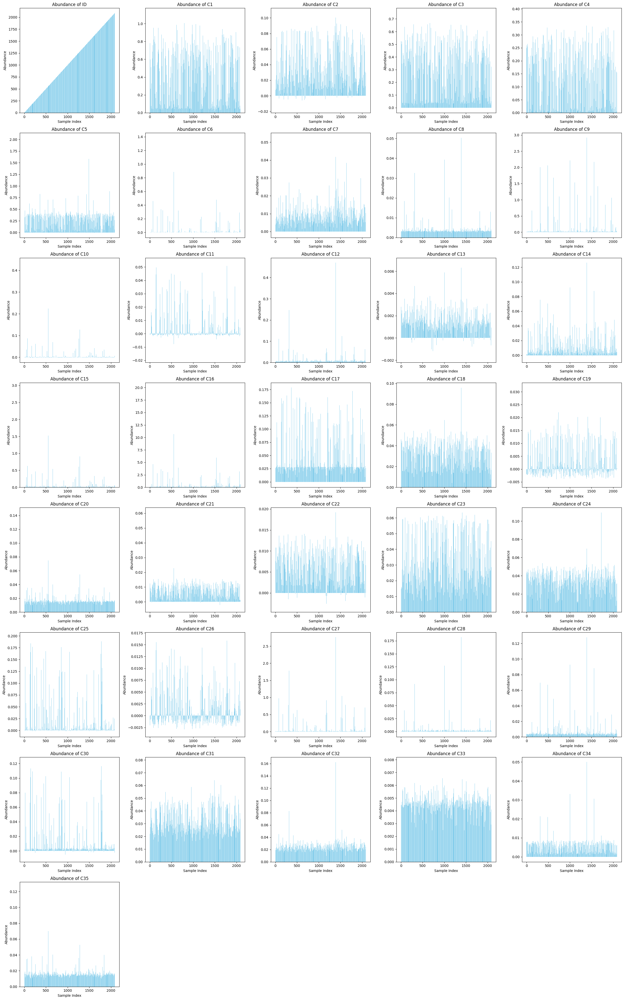

In [11]:
import matplotlib.pyplot as plt
plot_cell_abundance(submission_df)

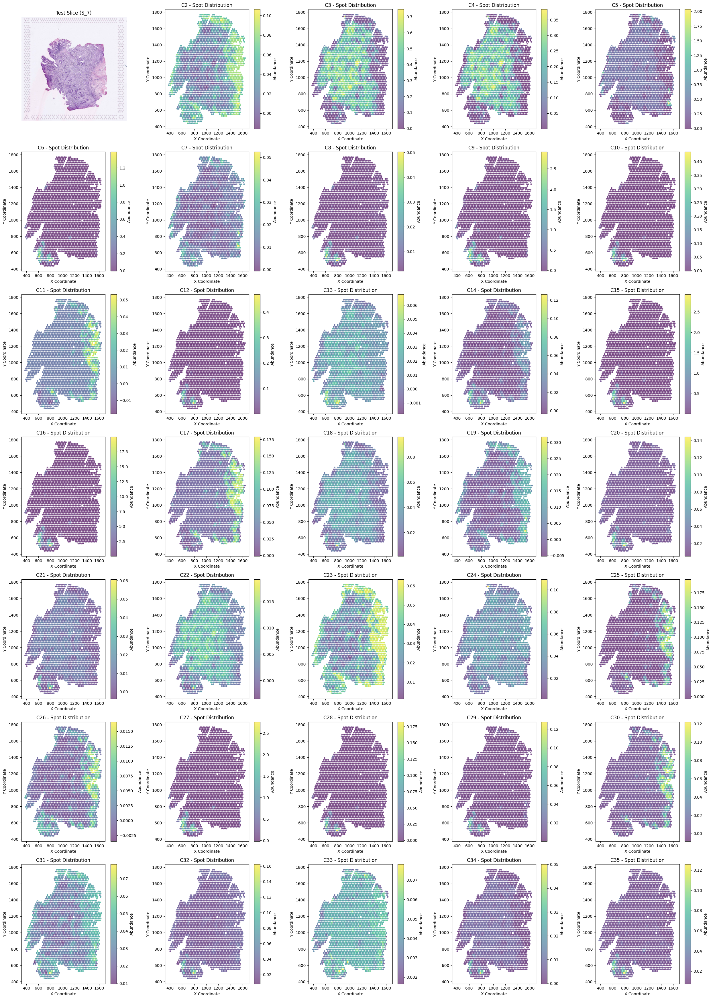

In [12]:

def plot_cell_abundance_with_spots_and_image(submission_df, hdf5_path):
    # Get the list of cell types (columns C1, C2, ..., C35)
    cell_types = [col for col in submission_df.columns if col.startswith('C')]

    # Set the number of rows and columns for the grid of subplots
    num_cell_types = len(cell_types)
    cols = 5  # Number of columns in the grid
    rows = (num_cell_types // cols) + (1 if num_cell_types % cols > 0 else 0)

    # Open the HDF5 file to load the image of the test slice (S_7)
    with h5py.File(hdf5_path, 'r') as f:
        test_slice_image = np.array(f['images/Test/S_7'])  # Load the S_7 image
        spots_coords = np.array(f['spots/Test/S_7'])  # Load spots coordinates (x, y)

    # Convert spots coordinates into a DataFrame and create an 'ID' column
    spots_df = pd.DataFrame(spots_coords, columns=['x', 'y'] + [f'CellType_{i}' for i in range(1, 36)])
    spots_df['ID'] = spots_df.index  # Add an 'ID' column to match submission_df

    # Merge the submission dataframe with the spots dataframe on 'ID'
    submission_df = submission_df.merge(spots_df, on='ID')
    # Create subplots
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

    # Flatten axes for easy indexing
    axes = axes.flatten()

    # Plot the image of the test slice (S_7) in the first subplot
    axes[0].imshow(test_slice_image)
    axes[0].axis('off')
    axes[0].set_title('Test Slice (S_7)')

    # Plot the distribution of each cell type in the grid, along with the spots
    for i, cell_type in enumerate(cell_types):
        if i == 0:
            # Skip the first subplot as it already contains the image
            continue

        # Scatter plot for spots with coloring based on cell type abundance
        scatter = axes[i].scatter(submission_df['x'], submission_df['y'], 
                                  c=submission_df[cell_type], cmap='viridis', s=10, alpha=0.6)

        # Title and labels
        axes[i].set_title(f'{cell_type} - Spot Distribution')
        axes[i].set_xlabel('X Coordinate')
        axes[i].set_ylabel('Y Coordinate')

        # Add color bar to show abundance levels
        fig.colorbar(scatter, ax=axes[i], label='Abundance')

    # Remove extra subplots if necessary
    for i in range(num_cell_types + 1, len(axes)):  # +1 because the first subplot contains the image
        axes[i].axis('off')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

# Example usage:
# submission_df = pd.read_csv('submission.csv')  # Assuming the data is stored in a CSV
hdf5_path = '/kaggle/input/el-hackathon-2025/elucidata_ai_challenge_data.h5'
plot_cell_abundance_with_spots_and_image(submission_df, hdf5_path)
